In [1]:
%matplotlib inline

import glob
import matplotlib
from matplotlib import pyplot
import numpy
import os
import pandas
import plotly.graph_objects as go
import plotly.express as px
import seaborn
from sklearn import neighbors
import sys

import fit_inverse_sigmoid as fis

pandas.set_option('max.rows', 500)
pandas.set_option('max.columns', 500)
print(f'Package versions:\nPython {sys.version}, matplotlib {matplotlib.__version__}, '
      f'numpy {numpy.__version__}, pandas {pandas.__version__}, '
      f'plotly {sys.modules["plotly"].__version__}, '
      f'seaborn {seaborn.__version__}, scikit-learn {sys.modules["sklearn"].__version__}')

Package versions:
Python 3.7.12 | packaged by conda-forge | (default, Oct 26 2021, 06:08:53) 
[GCC 9.4.0], matplotlib 3.4.2, numpy 1.21.0, pandas 1.1.5, plotly 5.16.1, seaborn 0.11.1, scikit-learn 0.23.1


## Load the LHON/SILENT time course data

In [2]:
#get single cell heteroplasmy estimates
scilite_estimates = pandas.read_csv('./heteroplasmy_dataframe.csv')
scilite_estimates.columns = scilite_estimates.columns.str.replace('_HET', '_het')
scilite_estimates['condition_no_rep'] = scilite_estimates['condition'].str.split('_r', expand=True)[0]
print(scilite_estimates.shape)
scilite_estimates.head()

(15078, 14)


,cell_id,condition,umi_count,LHON,LHON/SILENT,SILENT,WT,umi_count_for_filtering,umi_count_rank,LHON_het,SILENT_het,SILENT_ONLY_het,total_het,condition_no_rep
0,A1-CCGTGAGA-TGCCAGCC,d5_silent_r1,61,0,0,52,9,61,3649,0.000000,0.852459,0.852459,0.852459,d5_silent
1,A1-ACGCTCGA-TGTCTCAT,d0_silent_r3,65,0,0,61,4,65,3091,0.000000,0.938462,0.938462,0.938462,d0_silent
2,A1-AGTACAAG-GCATGCCG,d0_lhon_r3,44,0,32,12,0,44,7158,0.727273,1.000000,0.272727,1.000000,d0_lhon
3,A1-ACTCTTAG-GTTGCTGT,d10_silent_r3,64,0,0,47,17,64,3223,0.000000,0.734375,0.734375,0.734375,d10_silent
4,A1-CGAACTTA-TGCCAGCC,d5_silent_r1,93,0,0,91,2,93,1068,0.000000,0.978495,0.978495,0.978495,d5_silent


In [3]:
#make new time point column with "day" spelled out
tp_map = {'d0':'day 0', 'd5':'day 5', 'd10':'day 10', 'd15':'day 15'}
scilite_estimates['timepoint'] = [tp_map[elt.split('_')[0]] for elt in scilite_estimates['condition_no_rep'].to_numpy()]

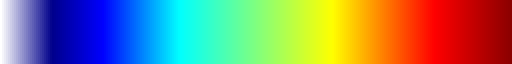

In [4]:
#make custom jet colormap that starts from white
color_list = ['white', 'darkblue', 'blue', 'cyan', 'yellow', 'red', 'darkred']
color_frac = [0.0, 0.1, 0.2, 0.35, 0.65, 0.85, 1.0]
testjet = matplotlib.colors.LinearSegmentedColormap.from_list('testjet', list(zip(color_frac, color_list)))
testjet

In [6]:
#filter for just the LHON-edited cells that we want to model
day_vals = ['d0_lhon', 'd5_lhon', 'd10_lhon', 'd15_lhon']
lhon_cells = scilite_estimates[scilite_estimates['condition_no_rep'].isin(day_vals)].copy()
print(lhon_cells.shape)
print(lhon_cells[lhon_cells['condition_no_rep'] == 'd0_lhon'].shape)

#make a variable with the output directory name and create the directory if it doesn't exist
outdir = './hyperparam_search_train_all_invsig_func_kde_mse'
if not os.path.isdir(outdir):
    os.makedirs(outdir)

(6529, 15)
(1090, 15)


## Run the fit_inverse_sigmoid.py (outside of this notebook), then plot results

In [7]:
#grab the model fitting results
res_paths = glob.glob(f'{outdir}/fit_inverse_sigmoid.all_iterations.csv')
test = pandas.concat([pandas.read_csv(elt, index_col=0) for elt in res_paths])

print(test.shape)
test.head()

(20000, 15)


,depth,loc,pitch,mtCN,seed,day0_lhon_mean,day0_silent_mean,day5_lhon_mean,day5_silent_mean,day10_lhon_mean,day10_silent_mean,day15_lhon_mean,day15_silent_mean,kde_mse,mean_het_mse
0,0.471391,0.813748,12.052817,500,0,0.707739,0.255103,0.619506,0.312325,0.548353,0.337626,0.508119,0.385029,0.680192,0.003836
1,0.568827,0.748390,7.304746,1000,1,0.692985,0.255380,0.595708,0.298588,0.512262,0.347939,0.444081,0.363054,0.283988,0.001289
2,0.356398,0.432464,8.042071,4000,2,0.702755,0.254544,0.404433,0.265850,0.163320,0.278376,0.090588,0.244684,3.772492,0.026288
3,0.343097,0.784165,3.816859,1000,3,0.695128,0.250728,0.571667,0.315828,0.484220,0.367068,0.395854,0.389524,0.338433,0.000510
4,0.394117,0.752025,12.871258,4000,4,0.705801,0.261341,0.585979,0.314716,0.545570,0.358027,0.513014,0.373646,0.795001,0.003454


In [14]:
#print the best iteration
best_iter = test[test['smoothed_mse'] == test['smoothed_mse'].min()].copy()
best_iter['color'] = test['smoothed_mse'].max()
best_iter

,depth,loc,pitch,mtCN,seed,day0_lhon_mean,day0_silent_mean,day5_lhon_mean,day5_silent_mean,day10_lhon_mean,day10_silent_mean,day15_lhon_mean,day15_silent_mean,kde_mse,mean_het_mse,combined_mse,smoothed_mse,color
107,0.310461,0.749159,4.94627,2000,107,0.698139,0.255602,0.559134,0.32694,0.461286,0.369915,0.396177,0.382172,0.102905,0.000247,0.009567,0.042023,2.383961


### Model fitting visualization

In [17]:
#plot all three of the key inverse sigmoid parameters together and color by model performance
test['log_smoothed_mse'] = numpy.log(test['smoothed_mse'])
corner_idx = (test['loc'] > best_iter['loc'].values[0]) & (test['depth'] < best_iter['depth'].values[0])
fig = px.scatter_3d(test, x='loc', y='depth', z='pitch', 
                    color='log_smoothed_mse', opacity=1)
fig.update_traces(marker=dict(size=2,
                              line=dict(width=0,
                                        color='DarkSlateGrey'),
                              opacity=1),
                  selector=dict(mode='markers'))

bloc, bdep, bpit = best_iter[['loc', 'depth', 'pitch']].values.flatten()
fig.add_trace(go.Scatter3d(x=best_iter['loc'], y=best_iter['depth'], z=best_iter['pitch'], 
                           marker={'size':10,'color':'gold'}, showlegend=False))
xvals = [0.4, bloc, bloc, 0.9, 0.9, 0.4, 0.4]
yvals = [0.01, 0.01, bdep, bdep, 0.99, 0.99, 0.01]
fig.add_trace(go.Scatter3d(mode='lines', x=xvals, y=yvals, z=[13]*len(xvals), 
                           marker={'color':'orange'}, showlegend=False))
fig.add_trace(go.Scatter3d(mode='lines', x=xvals, y=yvals, z=[1]*len(xvals),
                           marker={'color':'orange'}, showlegend=False))
for x,y in zip (xvals, yvals):
    fig.add_trace(go.Scatter3d(mode='lines', x=[x, x], y=[y, y], z=[1, 13], 
                               marker={'color':'orange'}, showlegend=False))
fig.update_layout(legend= {'itemsizing': 'constant'})

config = {
  'toImageButtonOptions': {
    'format': 'png', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    'height': 500,
    'width': 700,
    'scale':8 # Multiply title/legend/axis/canvas sizes by this factor
  }
}
fig.show(renderer='notebook', config=config)

In [18]:
#plot all three of the key inverse sigmoid parameters together and color by model performance (this time with lighter
#  opacity for the points between the best model and the edge of the hyperparameter cube -- to make the best model
#  easier to see)
test['log_smoothed_mse'] = numpy.log(test['smoothed_mse'])
corner_idx = (test['loc'] > best_iter['loc'].values[0]) & (test['depth'] < best_iter['depth'].values[0])
fig = px.scatter_3d(test[~corner_idx], x='loc', y='depth', z='pitch', 
                    color='log_smoothed_mse', color_continuous_scale='plasma', opacity=1)
fig.update_traces(marker=dict(size=2,
                              line=dict(width=0,
                                        color='DarkSlateGrey'),
                              opacity=1),
                  selector=dict(mode='markers'))
fig.add_trace(go.Scatter3d(mode='markers', x=test.loc[corner_idx, 'loc'], y=test.loc[corner_idx, 'depth'], 
                           z=test.loc[corner_idx, 'pitch'],
                           marker={'color':test.loc[corner_idx, 'log_smoothed_mse'], 'size':2, 'opacity':0.2,
                                   'cmax':test['log_smoothed_mse'].max(), 'cmin':test['log_smoothed_mse'].min(),
                                   'colorscale':'plasma'}, showlegend=False))

bloc, bdep, bpit = best_iter[['loc', 'depth', 'pitch']].values.flatten()
fig.add_trace(go.Scatter3d(x=best_iter['loc'], y=best_iter['depth'], z=best_iter['pitch'], 
                           marker={'size':10,'color':'gold'}, showlegend=False))
xvals = [0.4, bloc, bloc, 0.9, 0.9, 0.4, 0.4]
yvals = [0.01, 0.01, bdep, bdep, 0.99, 0.99, 0.01]
fig.add_trace(go.Scatter3d(mode='lines', x=xvals, y=yvals, z=[13]*len(xvals), 
                           marker={'color':'orange'}, showlegend=False))
fig.add_trace(go.Scatter3d(mode='lines', x=xvals, y=yvals, z=[1]*len(xvals),
                           marker={'color':'orange'}, showlegend=False))
for x,y in zip (xvals, yvals):
    fig.add_trace(go.Scatter3d(mode='lines', x=[x, x], y=[y, y], z=[1, 13], 
                               marker={'color':'orange'}, showlegend=False))
fig.update_layout(legend= {'itemsizing': 'constant'})

config = {
  'toImageButtonOptions': {
    'format': 'png', # one of png, svg, jpeg, webp
    'filename': 'custom_image',
    'height': 500,
    'width': 700,
    'scale':8 # Multiply title/legend/axis/canvas sizes by this factor
  }
}
fig.show(renderer='notebook', config=config)

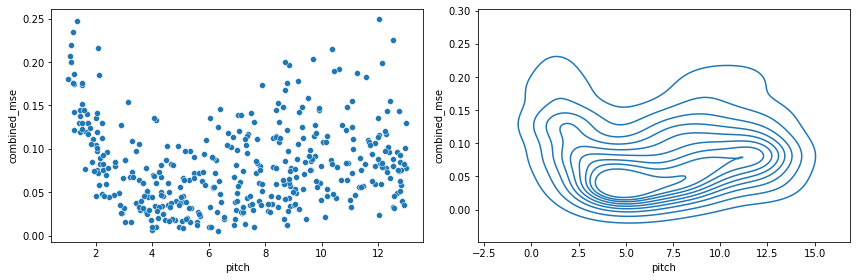

In [19]:
#plot MSE vs pitch
to_plot = test[(numpy.abs(test['depth'] - best_iter['depth'].values[0]) < 0.05)
               & (numpy.abs(test['loc'] - best_iter['loc'].values[0]) < 0.05)]
fig, axes = pyplot.subplots(nrows=1, ncols=2, figsize=(12,4))
seaborn.scatterplot(data=to_plot, x='pitch', y='combined_mse', ax=axes[0])
seaborn.kdeplot(data=to_plot, x='pitch', y='combined_mse', ax=axes[1])
fig.tight_layout()

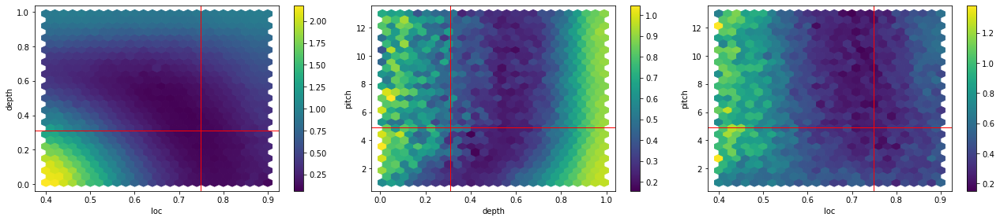

In [20]:
#plot the 2D marginal facets of the hyperparameter space
fig, axes = pyplot.subplots(nrows=1, ncols=3, figsize=(18,4))

#depth vs loc
depthloc_bins = axes[0].hexbin(test['loc'], test['depth'], C=test['smoothed_mse'], gridsize=25)
offsets = depthloc_bins.get_offsets()
values = depthloc_bins.get_array()
axes[0].axvline(best_iter['loc'].values[0], color='r', linewidth=1)
axes[0].axhline(best_iter['depth'].values[0], color='r', linewidth=1)
fig.colorbar(depthloc_bins, ax=axes[0])
axes[0].set_xlabel('loc')
axes[0].set_ylabel('depth')

#depth vs pitch
depthpitch_bins = axes[1].hexbin(test['depth'], test['pitch'], C=test['smoothed_mse'], gridsize=25)
offsets = depthpitch_bins.get_offsets()
values = depthpitch_bins.get_array()
axes[1].axvline(best_iter['depth'].values[0], color='r', linewidth=1)
axes[1].axhline(best_iter['pitch'].values[0], color='r', linewidth=1)
fig.colorbar(depthpitch_bins, ax=axes[1])
axes[1].set_xlabel('depth')
axes[1].set_ylabel('pitch')

#loc vs pitch
locpitch_bins = axes[2].hexbin(test['loc'], test['pitch'], C=test['smoothed_mse'], gridsize=25)
offsets = locpitch_bins.get_offsets()
values = locpitch_bins.get_array()
axes[2].axvline(best_iter['loc'].values[0], color='r', linewidth=1)
axes[2].axhline(best_iter['pitch'].values[0], color='r', linewidth=1)
fig.colorbar(locpitch_bins, ax=axes[2])
axes[2].set_xlabel('loc')
axes[2].set_ylabel('pitch')

fig.savefig('./prolif_model_inverse_sigmoid.hyperparam_search_margins.pdf', bbox_inches='tight')
fig.tight_layout()

[8.75974585]


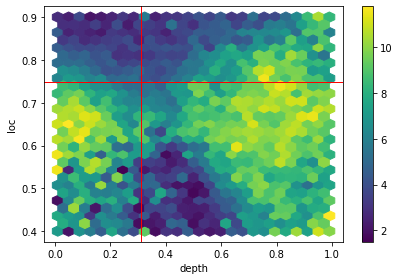

In [21]:
#try plotting the pitch as the color on the location vs depth plot
def weighted_mean_pitch(x):
    x = numpy.array(x)
    return numpy.average(x[:,0], weights=1 - x[:,1])

min_mse_pitch = lambda x: numpy.array(x)[numpy.argmin(numpy.array(x)[:,1]),0]

def min_mse_mean_pitch(x):
    x = numpy.array(x)
    pct25 = numpy.max([int(round(x.shape[0]*0.25)), 1])
    sort_idx = numpy.argsort(x[:,1])
    return numpy.mean(x[sort_idx[:pct25], 0])

fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))
depthloc_bins = axes.hexbin(test['depth'], test['loc'], C=test[['pitch', 'smoothed_mse']].to_numpy(), 
                            reduce_C_function=min_mse_mean_pitch, gridsize=25)
axes.axvline(best_iter['depth'].values[0], color='r', linewidth=1)
axes.axhline(best_iter['loc'].values[0], color='r', linewidth=1)
fig.colorbar(depthloc_bins, ax=axes)
axes.set_xlabel('depth')
axes.set_ylabel('loc')

fig.tight_layout()

offsets = depthloc_bins.get_offsets()
pitchval = depthloc_bins.get_array()[(offsets[:,0] == best_depthloc[0]) & (offsets[:,1] == best_depthloc[1])]
print(pitchval)

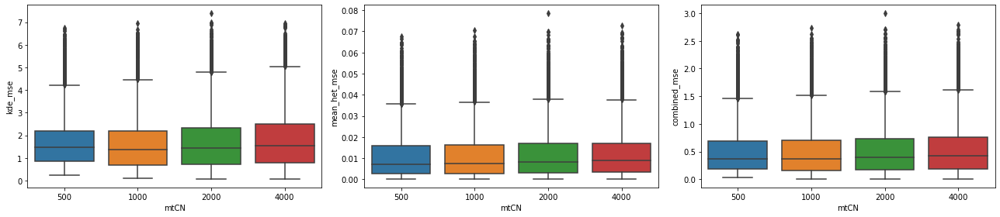

In [22]:
#plots to check the influence of the mtCN modeling parameter
fig, axes = pyplot.subplots(nrows=1, ncols=3, figsize=(18,4))

seaborn.boxplot(data=test, x='mtCN', y='kde_mse', ax=axes[0])
seaborn.boxplot(data=test, x='mtCN', y='mean_het_mse', ax=axes[1])
seaborn.boxplot(data=test, x='mtCN', y='combined_mse', ax=axes[2])

fig.tight_layout()

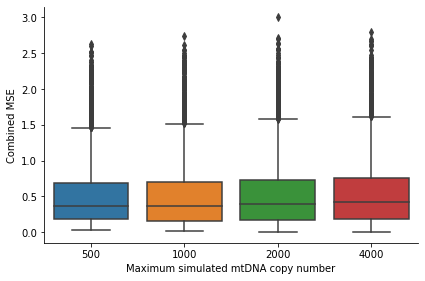

In [23]:
#choose the combined MSE plot to include in the supplement
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(6,4))

seaborn.boxplot(data=test, x='mtCN', y='combined_mse', ax=axes)
axes.set_ylabel('Combined MSE')
axes.set_xlabel('Maximum simulated mtDNA copy number')

axes.spines['top'].set_visible(False)
axes.spines['right'].set_visible(False)

fig.savefig('./prolif_model_inverse_sigmoid.hyperparam_search_mtCN.pdf', bbox_inches='tight')
fig.tight_layout()

### Visualizations of the best model

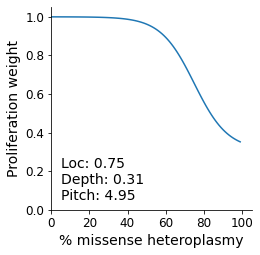

In [25]:
#plot the fitted inverse sigmoid function along with the best model parameters
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(3.5,3.4), constrained_layout=True)
xvals = numpy.arange(0,1,0.01)
depth, loc, pitch = best_iter[['depth', 'loc', 'pitch']].values.flatten()
sim_func = lambda x:((1-depth)*(((10**pitch)**-(x-loc))/(1+(10**pitch)**-(x-loc)))) + depth
axes.plot(xvals, [sim_func(x) for x in xvals])
axes.annotate(f'Loc: {loc:0.2f}\nDepth: {depth:0.2f}\nPitch: {pitch:0.2f}', (0.05,0.05), fontsize=14)
axes.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes.set_xlim((0,1.05))
axes.set_ylim((0,1.05))
axes.set_xticklabels([0, 20, 40, 60, 80, 100])
axes.set_xlabel('% missense heteroplasmy', fontsize=14)
axes.set_ylabel('Proliferation weight', fontsize=14)
axes.tick_params(labelsize=12)

for spine in ['top', 'right']:
    axes.spines[spine].set_visible(False)

fig.savefig('./prolif_model_inverse_sigmoid.pdf', bbox_inches='tight')
fig.show()

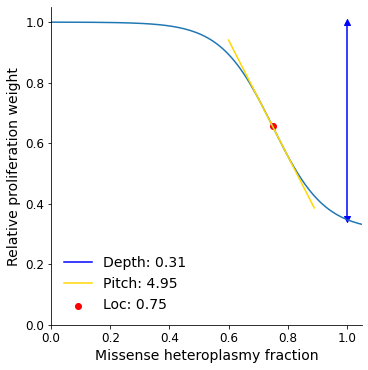

In [26]:
#an alternative plot with annotations that illustrate the effects of the parameters of the inverse sigmoid function
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(5,5), constrained_layout=True)
xvals = numpy.arange(0,1.5,0.01)
depth, loc, pitch = best_iter[['depth', 'loc', 'pitch']].values.flatten()
sim_func = lambda x:((1-depth)*(((10**pitch)**-(x-loc))/(1+(10**pitch)**-(x-loc)))) + depth
axes.plot(xvals, [sim_func(x) for x in xvals])
axes.scatter([loc], [sim_func(loc)], color='r', label=f'Loc: {loc:0.2f}')
axes.plot([1.0,1.0], [sim_func(1.0), sim_func(0)], color='b', label=f'Depth: {depth:0.2f}')
axes.scatter([1.0], [sim_func(1.0)], color='b', marker='v')
axes.scatter([1.0], [sim_func(0)], color='b', marker='^')
mval = (sim_func(xvals[80]) - sim_func(xvals[70]))/(xvals[80] - xvals[70])
bval = sim_func(xvals[80]) - (mval*xvals[80])
pitchfunc = lambda x: mval*x + bval
axes.plot(xvals[60:90], [pitchfunc(elt) for elt in xvals[60:90]], color='gold', label=f'Pitch: {pitch:0.2f}')
axes.set_xlim((0,1.05))
axes.set_ylim((0,1.05))
axes.set_xlabel('Missense heteroplasmy fraction', fontsize=14)
axes.set_ylabel('Relative proliferation weight', fontsize=14)
axes.tick_params(labelsize=12)
axes.legend(loc='lower left', frameon=False, fontsize=14)

for spine in ['top', 'right']:
    axes.spines[spine].set_visible(False)

fig.savefig('./prolif_model_inverse_sigmoid.hyperparams_annot.pdf', bbox_inches='tight')
fig.show()

0.56


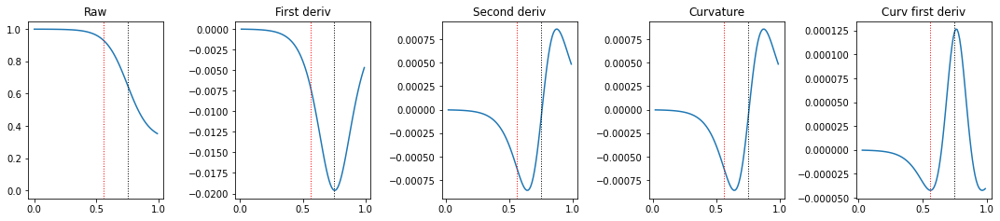

In [27]:
#can we call the biochemical threshold by detecting the point of maximum curvature in the fitted inverse sigmoid?
depth, loc, pitch = best_iter[['depth', 'loc', 'pitch']].values.flatten()
sim_func = lambda x:((1-depth)*(((10**pitch)**-(x-loc))/(1+(10**pitch)**-(x-loc)))) + depth
xvals = numpy.arange(0,1,0.01)
yvals = numpy.array([sim_func(x) for x in xvals])
mom1 = yvals[1:] - yvals[:-1]
mom2 = mom1[1:] - mom1[:-1]
#calculate curvature using the formula from the answer here:
#  https://math.stackexchange.com/questions/347856/how-to-find-the-point-where-the-curvature-is-maximum
curve = mom2/((1 + (mom1[1:]**2))**(3/2))
curve_mom1 = curve[1:] - curve[:-1]
biochem_threshold = xvals[numpy.argmin(curve_mom1) + 3]
print(biochem_threshold)

#plot the transformed curve at each step
fig, axes = pyplot.subplots(nrows=1, ncols=5, figsize=(15,3.4))
axes[0].plot(xvals, yvals)
axes[0].axvline(biochem_threshold, linestyle='dotted', linewidth=1, color='r')
axes[0].axvline(loc, linestyle='dotted', linewidth=1, color='k')
axes[0].set_ylim((-0.05, 1.05))
axes[0].set_title('Raw')
axes[1].plot(xvals[1:], mom1)
axes[1].axvline(biochem_threshold, linestyle='dotted', linewidth=1, color='r')
axes[1].axvline(loc, linestyle='dotted', linewidth=1, color='k')
axes[1].set_title('First deriv')
axes[2].plot(xvals[2:], mom2)
axes[2].axvline(biochem_threshold, linestyle='dotted', linewidth=1, color='r')
axes[2].axvline(loc, linestyle='dotted', linewidth=1, color='k')
axes[2].set_title('Second deriv')
axes[3].plot(xvals[2:], curve)
axes[3].axvline(biochem_threshold, linestyle='dotted', linewidth=1, color='r')
axes[3].axvline(loc, linestyle='dotted', linewidth=1, color='k')
axes[3].set_title('Curvature')
axes[4].plot(xvals[3:], curve_mom1)
axes[4].axvline(biochem_threshold, linestyle='dotted', linewidth=1, color='r')
axes[4].axvline(loc, linestyle='dotted', linewidth=1, color='k')
axes[4].set_title('Curv first deriv')
fig.tight_layout()

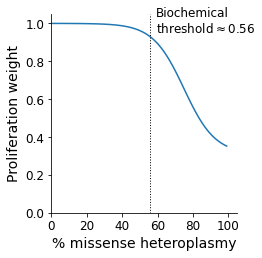

In [28]:
#plot the inverse sigmoid with the estimated biochemical threshold annotated
fig, axes = pyplot.subplots(nrows=1, ncols=1, figsize=(3.5,3.4), constrained_layout=True)

axes.plot(xvals, yvals)
axes.axvline(biochem_threshold, color='k', linestyle='dotted', linewidth=1)
axes.annotate('Biochemical\nthreshold' + fr'$\approx{biochem_threshold}$', (biochem_threshold+0.03, 0.95), fontsize=12)
axes.set_xticks([0, 0.2, 0.4, 0.6, 0.8, 1.0])
axes.set_xlim((0,1.05))
axes.set_ylim((0,1.05))
axes.set_xticklabels([0, 20, 40, 60, 80, 100])
axes.set_xlabel('% missense heteroplasmy', fontsize=14)
axes.set_ylabel('Proliferation weight', fontsize=14)
axes.tick_params(labelsize=12)

for spine in ['top', 'right']:
    axes.spines[spine].set_visible(False)

fig.savefig('./prolif_model_inverse_sigmoid.biochem.pdf', bbox_inches='tight')
fig.show()

### Compute predictions of fitness defect based on fitted model

In [30]:
print(f'Prolif weight at day 0 bulk heteroplasmy (65.55%): {sim_func(0.6555):0.2f}')
print(f'Prolif weight at biochem threshold: {sim_func(biochem_threshold):0.2f}')
print(f'Prolif weight at homoplasmy: {sim_func(1.0):0.2f}')

Prolif weight at day 0 bulk heteroplasmy (65.55%): 0.82
Prolif weight at biochem threshold: 0.93
Prolif weight at homoplasmy: 0.35


In [32]:
avg_LHON_dbl = numpy.mean([1.03, 0.95, 0.99])
avg_SILENT_dbl = numpy.mean([1.26, 1.28, 1.24])
print(f'Observed fitness defect in cell culture: {avg_LHON_dbl/avg_SILENT_dbl:0.2f}')

Observed fitness defect in cell culture: 0.79


## Test the fit of the best model by generating repeated synthetic results and comparing the distribution of mean heteroplasmy values per day predicted by the models to the observed values.

In [22]:
d0_lhon = lhon_cells.loc[lhon_cells['condition_no_rep'] == 'd0_lhon',
                         ['umi_count_for_filtering', 'LHON_het', 'SILENT_ONLY_het']].copy()
d0_lhon['umi_count_for_filtering'] = d0_lhon['umi_count_for_filtering'].astype(int)
d0_lhon['wt_het'] = 1 - d0_lhon[['LHON_het', 'SILENT_ONLY_het']].sum(axis=1)

print(d0_lhon.shape)

(1090, 4)


In [23]:
#Train 100 models with different random seeds and collect the results
lhon_means_prolif = []
silent_means_prolif = []
xorder = ['day 0', 'day 5', 'day 10', 'day 15']
for idx in range(100):
    print(idx)
    synth_tmp_prolif = fis.train_one_invsig_model(d0_lhon, depth=depth, loc=loc, pitch=pitch, 
                                                  binomial_count=1000, start_seed=idx+972)
    lhon_means_prolif.append(synth_tmp_prolif.groupby('timepoint')['LHON_het'].mean()[xorder].reset_index())
    silent_means_prolif.append(synth_tmp_prolif.groupby('timepoint')['SILENT_ONLY_het'].mean()[xorder].reset_index())
lhon_means_prolif = pandas.concat(lhon_means_prolif)
silent_means_prolif = pandas.concat(silent_means_prolif)

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99


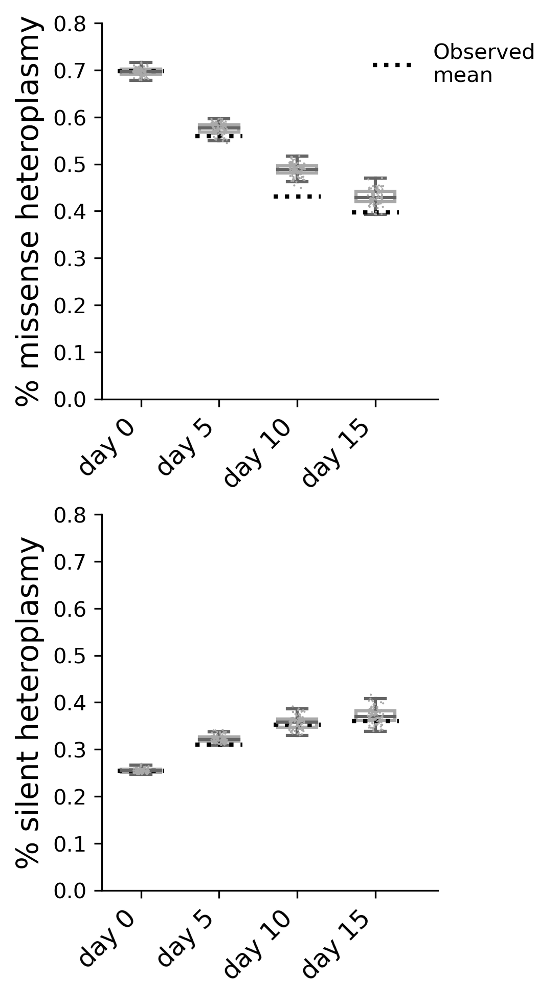

In [29]:
fig, axes = pyplot.subplots(nrows=2, ncols=1, figsize=(3.5,6.4), dpi=300, constrained_layout=True)

xorder = ['day 0', 'day 5', 'day 10', 'day 15']

#proliferative lhon
seaborn.boxplot(data=lhon_means_prolif, x='timepoint', y='LHON_het', ax=axes[0], order=xorder, 
                palette=['darkgrey'], showfliers=False, width=0.5)
seaborn.stripplot(data=lhon_means_prolif, x='timepoint', y='LHON_het',
                palette=['darkgrey'], dodge=True, s=1, order=xorder, ax=axes[0])
lhon_glu_idx = (lhon_cells['condition_no_rep'].isin(['d0_lhon', 'd5_lhon', 'd10_lhon', 'd15_lhon']))

for idx, meanval in enumerate(lhon_cells[lhon_glu_idx].groupby('timepoint')['LHON_het'].mean()[xorder].to_numpy()):
    lab = 'Observed\nmean' if not idx else None
    axes[0].plot([idx-0.3, idx+0.3], [meanval, meanval], linestyle='dotted', color='k', linewidth=2, label=lab)

axes[0].set_xlim(-0.5,3.8)
axes[0].set_ylim(0,0.8)
axes[0].set_xlabel('')
axes[0].set_ylabel('% missense heteroplasmy', fontsize=14)

axes[0].legend(loc='upper left', bbox_to_anchor=[0.75,1], frameon=False)


#proliferative silent
seaborn.boxplot(data=silent_means_prolif, x='timepoint', y='SILENT_ONLY_het', 
                palette=['darkgrey'], ax=axes[1], order=xorder, showfliers=False, width=0.5)
seaborn.stripplot(data=silent_means_prolif, x='timepoint', y='SILENT_ONLY_het', 
                palette=['darkgrey'], dodge=True, s=1, order=xorder, ax=axes[1])

for idx, meanval in enumerate(lhon_cells[lhon_glu_idx].groupby('timepoint')['SILENT_ONLY_het'].mean()[xorder].to_numpy()):
    lab = 'Observed means' if not idx else None
    axes[1].plot([idx-0.3, idx+0.3], [meanval, meanval], linestyle='dotted', color='k', linewidth=2, label=lab)

axes[1].set_xlim(-0.5,3.8)
axes[1].set_ylim(0,0.8)
axes[1].set_xlabel('')
axes[1].set_ylabel('% silent heteroplasmy', fontsize=14)


for ax in axes:
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, 0))
        patch.set_edgecolor((r, g, b, 1))

    ax.set_xticklabels(ax.get_xticklabels(), 
                       ha='right', rotation=45, fontsize=12)

fig.savefig('./model_comparison_boxplots.obs_prolif_model.invsig.pdf', bbox_inches='tight')
fig.show()

### Plot the synthetic joint LHON and SILENT heteroplasmy distribution for one random model.

11.725367225987029


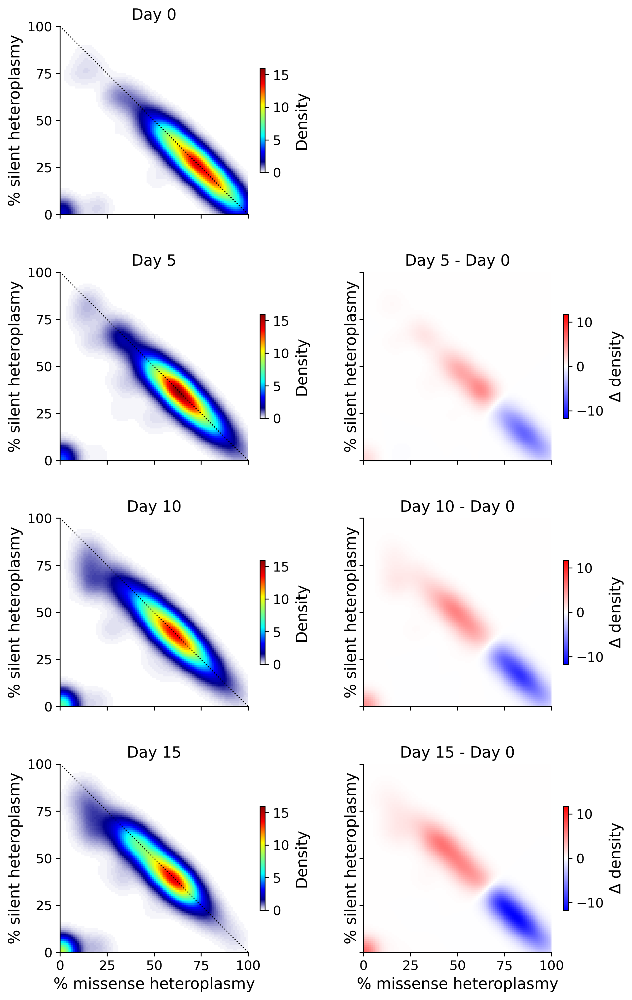

In [27]:
#get data
day_vals_synth = ['day 0', 'day 5', 'day 10', 'day 15']
to_plot_synth = synth_tmp_prolif.copy()

kde_res = []
x_d = numpy.meshgrid(numpy.linspace(0, 1.0, 100), numpy.linspace(0, 1.0, 100))
x_d = numpy.array([x_d[0].flatten(), x_d[1].flatten()]).T

for day_val in day_vals_synth:
    # instantiate and fit the KDE model
    kde = neighbors.KernelDensity(bandwidth=0.05, kernel='gaussian')
    kde.fit(to_plot_synth.loc[to_plot_synth['timepoint'] == day_val, ['LHON_het', 'SILENT_ONLY_het']])

    # score_samples returns the log of the probability density
    kde_res.append(numpy.exp(kde.score_samples(x_d)))

dmax = numpy.max(numpy.vstack(kde_res))
d5_d0_diff = kde_res[1] - kde_res[0]
d10_d0_diff = kde_res[2] - kde_res[0]
d15_d0_diff = kde_res[3] - kde_res[0]
minmax = numpy.max(numpy.absolute(numpy.vstack([d5_d0_diff, d10_d0_diff, d15_d0_diff])))
print(minmax)

fig, axes = pyplot.subplots(nrows=4, ncols=2, figsize=(8,13), sharex=True, sharey=True, dpi=300)

axes[0,1].axis('off')
for ax in axes.flatten():
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

im = axes[0,0].pcolormesh(kde_res[0].reshape(100,100), cmap=testjet, vmax=dmax)
axes[0,0].set_aspect('equal')
axes[0,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[0,0].tick_params(labelsize=12)
axes[0,0].set_title('Day 0', fontsize=14)
axes[0,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[0,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,0].pcolormesh(kde_res[1].reshape(100,100), cmap=testjet, vmax=dmax)
axes[1,0].set_aspect('equal')
axes[1,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,0].tick_params(labelsize=12)
axes[1,0].set_title('Day 5', fontsize=14)
axes[1,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[1,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,1].pcolormesh(d5_d0_diff.reshape(100,100), cmap='bwr', vmin=0-minmax, vmax=minmax)
axes[1,1].set_aspect('equal')
axes[1,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,1].tick_params(labelsize=12)
axes[1,1].set_title('Day 5 - Day 0', fontsize=14)
cb = fig.colorbar(im, ax=axes[1,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('$\Delta$ density', fontsize=14)

im = axes[2,0].pcolormesh(kde_res[2].reshape(100,100), cmap=testjet, vmax=dmax)
axes[2,0].set_aspect('equal')
axes[2,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,0].tick_params(labelsize=12)
axes[2,0].set_title('Day 10', fontsize=14)
axes[2,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[2,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[2,1].pcolormesh(d10_d0_diff.reshape(100,100), cmap='bwr', vmin=0-minmax, vmax=minmax)
axes[2,1].set_aspect('equal')
axes[2,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,1].tick_params(labelsize=12)
axes[2,1].set_title('Day 10 - Day 0', fontsize=14)
cb = fig.colorbar(im, ax=axes[2,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('$\Delta$ density', fontsize=14)

im = axes[3,0].pcolormesh(kde_res[3].reshape(100,100), cmap=testjet, vmax=dmax)
axes[3,0].set_aspect('equal')
axes[3,0].set_xticks([0, 25, 50, 75, 100])
axes[3,0].set_yticks([0, 25, 50, 75, 100])
axes[3,0].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,0].tick_params(labelsize=12)
axes[3,0].set_title('Day 15', fontsize=14)
axes[3,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[3,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[3,1].pcolormesh(d15_d0_diff.reshape(100,100), cmap='bwr', vmin=0-minmax, vmax=minmax)
axes[3,1].set_aspect('equal')
axes[3,0].set_xticks([0, 25, 50, 75, 100])
axes[3,0].set_yticks([0, 25, 50, 75, 100])
axes[3,1].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,1].tick_params(labelsize=12)
axes[3,1].set_title('Day 15 - Day 0', fontsize=14)
cb = fig.colorbar(im, ax=axes[3,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('$\Delta$ density', fontsize=14)

fig.tight_layout(w_pad=4.0)

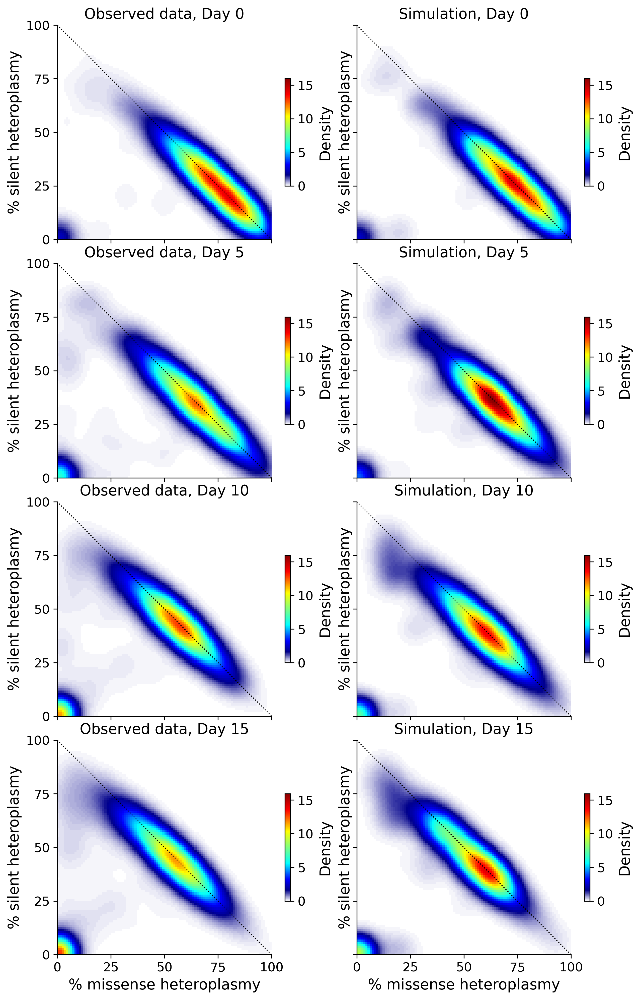

In [30]:
#get data
day_vals_synth = ['day 0', 'day 5', 'day 10', 'day 15']
to_plot_synth = synth_tmp_prolif.copy()
day_vals_obs = ['d0_lhon', 'd5_lhon', 'd10_lhon', 'd15_lhon']
to_plot_obs = (scilite_estimates[scilite_estimates['condition_no_rep'].isin(day_vals_obs)])

kde_res = []
kde_res_obs = []
x_d = numpy.meshgrid(numpy.linspace(0, 1.0, 100), numpy.linspace(0, 1.0, 100))
x_d = numpy.array([x_d[0].flatten(), x_d[1].flatten()]).T

for day_val in day_vals_synth:
    # instantiate and fit the KDE model
    kde = neighbors.KernelDensity(bandwidth=0.05, kernel='gaussian')
    kde.fit(to_plot_synth.loc[to_plot_synth['timepoint'] == day_val, ['LHON_het', 'SILENT_ONLY_het']])

    # score_samples returns the log of the probability density
    kde_res.append(numpy.exp(kde.score_samples(x_d)))
    
for day_val in day_vals_obs:
    # instantiate and fit the KDE model
    kde = neighbors.KernelDensity(bandwidth=0.05, kernel='gaussian')
    kde.fit(to_plot_obs.loc[to_plot_obs['condition_no_rep'] == day_val, ['LHON_het', 'SILENT_ONLY_het']])

    # score_samples returns the log of the probability density
    kde_res_obs.append(numpy.exp(kde.score_samples(x_d)))

dmax = numpy.max(numpy.vstack(kde_res))
dmax_obs = numpy.max(numpy.vstack(kde_res))

fig, axes = pyplot.subplots(nrows=4, ncols=2, figsize=(8,13), sharex=True, sharey=True, dpi=300)


for ax in axes.flatten():
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

#plot observed data in the left plot
im = axes[0,0].pcolormesh(kde_res_obs[0].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[0,0].set_aspect('equal')
axes[0,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[0,0].tick_params(labelsize=12)
axes[0,0].set_title('Observed data, Day 0', fontsize=14)
axes[0,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[0,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,0].pcolormesh(kde_res_obs[1].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[1,0].set_aspect('equal')
axes[1,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,0].tick_params(labelsize=12)
axes[1,0].set_title('Observed data, Day 5', fontsize=14)
axes[1,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[1,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[2,0].pcolormesh(kde_res_obs[2].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[2,0].set_aspect('equal')
axes[2,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,0].tick_params(labelsize=12)
axes[2,0].set_title('Observed data, Day 10', fontsize=14)
axes[2,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[2,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[3,0].pcolormesh(kde_res_obs[3].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[3,0].set_aspect('equal')
axes[3,0].set_xticks([0, 25, 50, 75, 100])
axes[3,0].set_yticks([0, 25, 50, 75, 100])
axes[3,0].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,0].tick_params(labelsize=12)
axes[3,0].set_title('Observed data, Day 15', fontsize=14)
axes[3,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[3,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

#plot the simulated data in the right column
im = axes[0,1].pcolormesh(kde_res[0].reshape(100,100), cmap=testjet, vmax=dmax)
axes[0,1].set_aspect('equal')
axes[0,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[0,1].tick_params(labelsize=12)
axes[0,1].set_title('Simulation, Day 0', fontsize=14)
axes[0,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[0,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,1].pcolormesh(kde_res[1].reshape(100,100), cmap=testjet, vmax=dmax)
axes[1,1].set_aspect('equal')
axes[1,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,1].tick_params(labelsize=12)
axes[1,1].set_title('Simulation, Day 5', fontsize=14)
axes[1,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[1,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[2,1].pcolormesh(kde_res[2].reshape(100,100), cmap=testjet, vmax=dmax)
axes[2,1].set_aspect('equal')
axes[2,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,1].tick_params(labelsize=12)
axes[2,1].set_title('Simulation, Day 10', fontsize=14)
axes[2,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[2,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[3,1].pcolormesh(kde_res[3].reshape(100,100), cmap=testjet, vmax=dmax)
axes[3,1].set_aspect('equal')
axes[3,1].set_xticks([0, 25, 50, 75, 100])
axes[3,1].set_yticks([0, 25, 50, 75, 100])
axes[3,1].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,1].tick_params(labelsize=12)
axes[3,1].set_title('Simulation, Day 15', fontsize=14)
axes[3,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[3,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

fig.savefig('./kde_plots_obs_prolif_model.invsig_model.pdf', bbox_inches='tight')
fig.tight_layout(w_pad=4.0)

## Try applying the same model to the SILENT-edited population

In [31]:
day_vals = ['d0_silent', 'd5_silent', 'd10_silent', 'd15_silent']
silent_cells = scilite_estimates.loc[scilite_estimates['condition_no_rep'].isin(day_vals)]
d0_silent = scilite_estimates.loc[scilite_estimates['condition_no_rep'] == 'd0_silent',
                                  ['umi_count_for_filtering', 'LHON_het', 'SILENT_ONLY_het']].copy()
d0_silent['umi_count_for_filtering'] = d0_silent['umi_count_for_filtering'].astype(int)
d0_silent['wt_het'] = 1 - d0_silent[['LHON_het', 'SILENT_ONLY_het']].sum(axis=1)

print(d0_silent.shape)

(1600, 4)


In [32]:
#Train 100 models with different random seeds and collect the results
lhon_means_prolif = []
silent_means_prolif = []
xorder = ['day 0', 'day 5', 'day 10', 'day 15']
for idx in range(100):
    synth_tmp_prolif = fis.train_one_invsig_model(d0_silent, depth=depth, loc=loc, pitch=pitch, 
                                                  binomial_count=1000, start_seed=idx+972)
    lhon_means_prolif.append(synth_tmp_prolif.groupby('timepoint')['LHON_het'].mean()[xorder].reset_index())
    silent_means_prolif.append(synth_tmp_prolif.groupby('timepoint')['SILENT_ONLY_het'].mean()[xorder].reset_index())
lhon_means_prolif = pandas.concat(lhon_means_prolif)
silent_means_prolif = pandas.concat(silent_means_prolif)

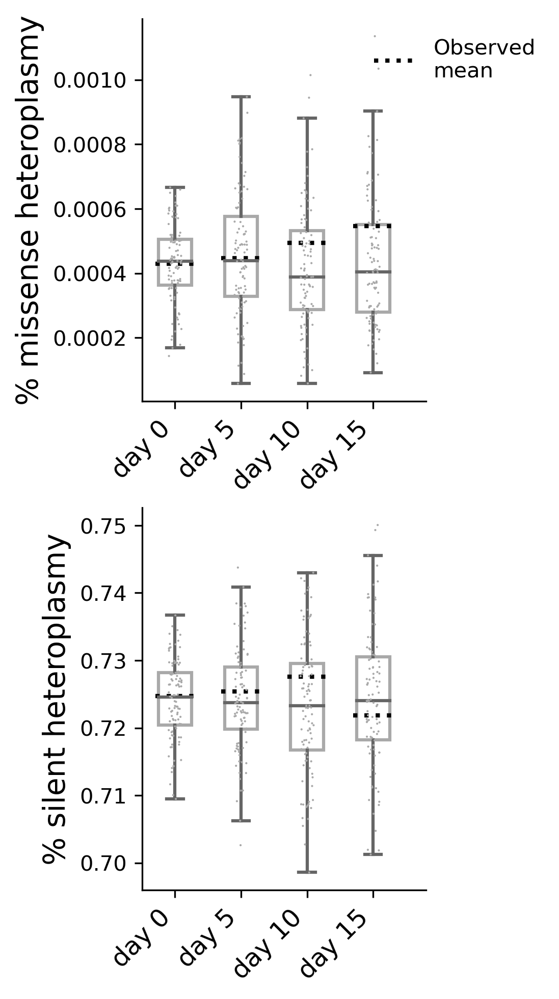

In [34]:
fig, axes = pyplot.subplots(nrows=2, ncols=1, figsize=(3.5,6.4), dpi=300, constrained_layout=True)

xorder = ['day 0', 'day 5', 'day 10', 'day 15']

#proliferative lhon
seaborn.boxplot(data=lhon_means_prolif, x='timepoint', y='LHON_het', ax=axes[0], order=xorder, 
                palette=['darkgrey'], showfliers=False, width=0.5)
seaborn.stripplot(data=lhon_means_prolif, x='timepoint', y='LHON_het',
                palette=['darkgrey'], dodge=True, s=1, order=xorder, ax=axes[0])
silent_idx = (silent_cells['condition_no_rep'].isin(['d0_silent', 'd5_silent', 'd10_silent', 'd15_silent']))

for idx, meanval in enumerate(silent_cells[silent_idx].groupby('timepoint')['LHON_het'].mean()[xorder].to_numpy()):
    lab = 'Observed\nmean' if not idx else None
    axes[0].plot([idx-0.3, idx+0.3], [meanval, meanval], linestyle='dotted', color='k', linewidth=2, label=lab)

axes[0].set_xlim(-0.5,3.8)
axes[0].set_xlabel('')
axes[0].set_ylabel('% missense heteroplasmy', fontsize=14)

axes[0].legend(loc='upper left', bbox_to_anchor=[0.75,1], frameon=False)


#proliferative silent
seaborn.boxplot(data=silent_means_prolif, x='timepoint', y='SILENT_ONLY_het', 
                palette=['darkgrey'], ax=axes[1], order=xorder, showfliers=False, width=0.5)
seaborn.stripplot(data=silent_means_prolif, x='timepoint', y='SILENT_ONLY_het', 
                palette=['darkgrey'], dodge=True, s=1, order=xorder, ax=axes[1])

for idx, meanval in enumerate(silent_cells[silent_idx].groupby('timepoint')['SILENT_ONLY_het'].mean()[xorder].to_numpy()):
    lab = 'Observed means' if not idx else None
    axes[1].plot([idx-0.3, idx+0.3], [meanval, meanval], linestyle='dotted', color='k', linewidth=2, label=lab)

axes[1].set_xlim(-0.5,3.8)
axes[1].set_xlabel('')
axes[1].set_ylabel('% silent heteroplasmy', fontsize=14)


for ax in axes:
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    for patch in ax.artists:
        r, g, b, a = patch.get_facecolor()
        patch.set_facecolor((r, g, b, 0))
        patch.set_edgecolor((r, g, b, 1))

    ax.set_xticklabels(ax.get_xticklabels(), 
                       ha='right', rotation=45, fontsize=12)

fig.show()

### Plot the synthetic joint LHON and SILENT heteroplasmy distribution for one random model.

1.8210017843831388


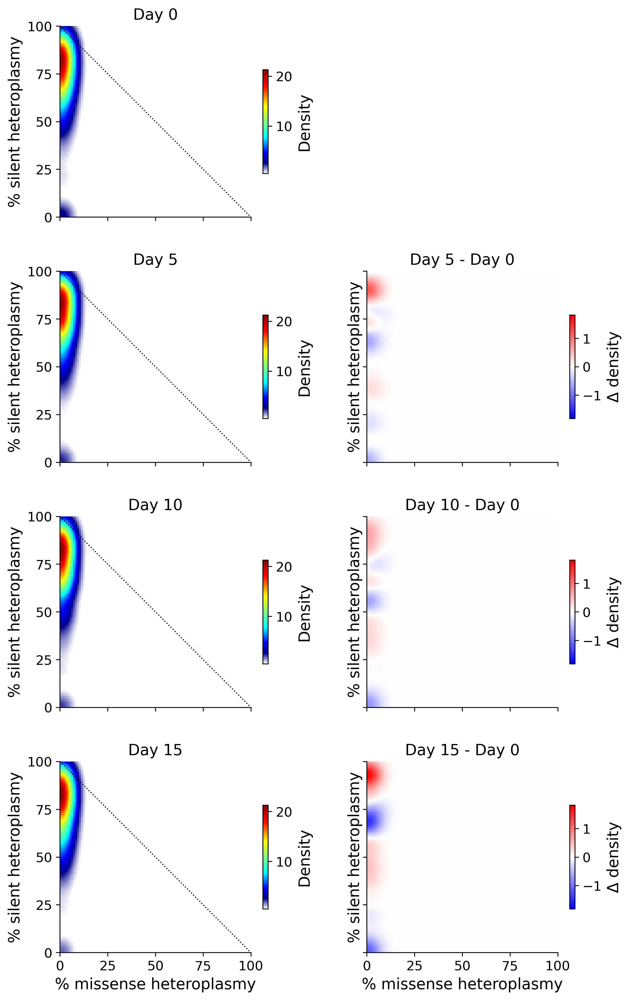

In [35]:
#get data
day_vals_synth = ['day 0', 'day 5', 'day 10', 'day 15']
to_plot_synth = synth_tmp_prolif.copy()

kde_res = []
x_d = numpy.meshgrid(numpy.linspace(0, 1.0, 100), numpy.linspace(0, 1.0, 100))
x_d = numpy.array([x_d[0].flatten(), x_d[1].flatten()]).T

for day_val in day_vals_synth:
    # instantiate and fit the KDE model
    kde = neighbors.KernelDensity(bandwidth=0.05, kernel='gaussian')
    kde.fit(to_plot_synth.loc[to_plot_synth['timepoint'] == day_val, ['LHON_het', 'SILENT_ONLY_het']])

    # score_samples returns the log of the probability density
    kde_res.append(numpy.exp(kde.score_samples(x_d)))

dmax = numpy.max(numpy.vstack(kde_res))
d5_d0_diff = kde_res[1] - kde_res[0]
d10_d0_diff = kde_res[2] - kde_res[0]
d15_d0_diff = kde_res[3] - kde_res[0]
minmax = numpy.max(numpy.absolute(numpy.vstack([d5_d0_diff, d10_d0_diff, d15_d0_diff])))
print(minmax)

#set small values to NaN so that those areas will be white in the plot
for kde_val in kde_res:
    kde_val[kde_val < 0.5] = numpy.nan

fig, axes = pyplot.subplots(nrows=4, ncols=2, figsize=(8,13), sharex=True, sharey=True, dpi=300)

axes[0,1].axis('off')
for ax in axes.flatten():
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

im = axes[0,0].pcolormesh(kde_res[0].reshape(100,100), cmap=testjet, vmax=dmax)
axes[0,0].set_aspect('equal')
axes[0,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[0,0].tick_params(labelsize=12)
axes[0,0].set_title('Day 0', fontsize=14)
axes[0,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[0,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,0].pcolormesh(kde_res[1].reshape(100,100), cmap=testjet, vmax=dmax)
axes[1,0].set_aspect('equal')
axes[1,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,0].tick_params(labelsize=12)
axes[1,0].set_title('Day 5', fontsize=14)
axes[1,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[1,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,1].pcolormesh(d5_d0_diff.reshape(100,100), cmap='bwr', vmin=0-minmax, vmax=minmax)
axes[1,1].set_aspect('equal')
axes[1,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,1].tick_params(labelsize=12)
axes[1,1].set_title('Day 5 - Day 0', fontsize=14)
cb = fig.colorbar(im, ax=axes[1,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('$\Delta$ density', fontsize=14)

im = axes[2,0].pcolormesh(kde_res[2].reshape(100,100), cmap=testjet, vmax=dmax)
axes[2,0].set_aspect('equal')
#axes[2,0].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[2,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,0].tick_params(labelsize=12)
axes[2,0].set_title('Day 10', fontsize=14)
axes[2,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[2,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[2,1].pcolormesh(d10_d0_diff.reshape(100,100), cmap='bwr', vmin=0-minmax, vmax=minmax)
axes[2,1].set_aspect('equal')
axes[2,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,1].tick_params(labelsize=12)
axes[2,1].set_title('Day 10 - Day 0', fontsize=14)
cb = fig.colorbar(im, ax=axes[2,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('$\Delta$ density', fontsize=14)

im = axes[3,0].pcolormesh(kde_res[3].reshape(100,100), cmap=testjet, vmax=dmax)
axes[3,0].set_aspect('equal')
axes[3,0].set_xticks([0, 25, 50, 75, 100])
axes[3,0].set_yticks([0, 25, 50, 75, 100])
axes[3,0].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,0].tick_params(labelsize=12)
axes[3,0].set_title('Day 15', fontsize=14)
axes[3,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[3,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[3,1].pcolormesh(d15_d0_diff.reshape(100,100), cmap='bwr', vmin=0-minmax, vmax=minmax)
axes[3,1].set_aspect('equal')
axes[3,0].set_xticks([0, 25, 50, 75, 100])
axes[3,0].set_yticks([0, 25, 50, 75, 100])
axes[3,1].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,1].tick_params(labelsize=12)
axes[3,1].set_title('Day 15 - Day 0', fontsize=14)
cb = fig.colorbar(im, ax=axes[3,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('$\Delta$ density', fontsize=14)

fig.tight_layout(w_pad=4.0)

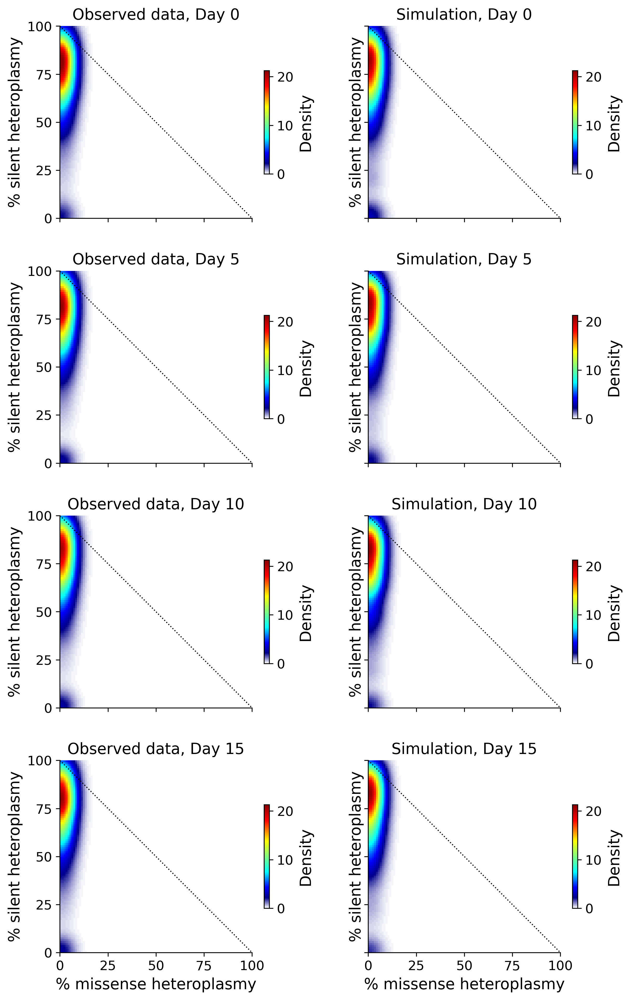

In [36]:
#get data
day_vals_synth = ['day 0', 'day 5', 'day 10', 'day 15']
to_plot_synth = synth_tmp_prolif.copy()
day_vals_obs = ['d0_silent', 'd5_silent', 'd10_silent', 'd15_silent']
to_plot_obs = (scilite_estimates[scilite_estimates['condition_no_rep'].isin(day_vals_obs)])

kde_res = []
kde_res_obs = []
x_d = numpy.meshgrid(numpy.linspace(0, 1.0, 100), numpy.linspace(0, 1.0, 100))
x_d = numpy.array([x_d[0].flatten(), x_d[1].flatten()]).T

for day_val in day_vals_synth:
    # instantiate and fit the KDE model
    kde = neighbors.KernelDensity(bandwidth=0.05, kernel='gaussian')
    kde.fit(to_plot_synth.loc[to_plot_synth['timepoint'] == day_val, ['LHON_het', 'SILENT_ONLY_het']])

    # score_samples returns the log of the probability density
    kde_res.append(numpy.exp(kde.score_samples(x_d)))
    
for day_val in day_vals_obs:
    # instantiate and fit the KDE model
    kde = neighbors.KernelDensity(bandwidth=0.05, kernel='gaussian')
    kde.fit(to_plot_obs.loc[to_plot_obs['condition_no_rep'] == day_val, ['LHON_het', 'SILENT_ONLY_het']])

    # score_samples returns the log of the probability density
    kde_res_obs.append(numpy.exp(kde.score_samples(x_d)))

dmax = numpy.max(numpy.vstack(kde_res))
dmax_obs = numpy.max(numpy.vstack(kde_res))

fig, axes = pyplot.subplots(nrows=4, ncols=2, figsize=(8,13), sharex=True, sharey=True, dpi=300)


for ax in axes.flatten():
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)

#plot observed data in the left plot
im = axes[0,0].pcolormesh(kde_res_obs[0].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[0,0].set_aspect('equal')
axes[0,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[0,0].tick_params(labelsize=12)
axes[0,0].set_title('Observed data, Day 0', fontsize=14)
axes[0,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[0,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,0].pcolormesh(kde_res_obs[1].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[1,0].set_aspect('equal')
axes[1,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,0].tick_params(labelsize=12)
axes[1,0].set_title('Observed data, Day 5', fontsize=14)
axes[1,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[1,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[2,0].pcolormesh(kde_res_obs[2].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[2,0].set_aspect('equal')
axes[2,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,0].tick_params(labelsize=12)
axes[2,0].set_title('Observed data, Day 10', fontsize=14)
axes[2,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[2,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[3,0].pcolormesh(kde_res_obs[3].reshape(100,100), cmap=testjet, vmax=dmax_obs)
axes[3,0].set_aspect('equal')
axes[3,0].set_xticks([0, 25, 50, 75, 100])
axes[3,0].set_yticks([0, 25, 50, 75, 100])
axes[3,0].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,0].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,0].tick_params(labelsize=12)
axes[3,0].set_title('Observed data, Day 15', fontsize=14)
axes[3,0].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[3,0], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

#plot the simulated data in the right column
im = axes[0,1].pcolormesh(kde_res[0].reshape(100,100), cmap=testjet, vmax=dmax)
axes[0,1].set_aspect('equal')
axes[0,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[0,1].tick_params(labelsize=12)
axes[0,1].set_title('Simulation, Day 0', fontsize=14)
axes[0,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[0,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[1,1].pcolormesh(kde_res[1].reshape(100,100), cmap=testjet, vmax=dmax)
axes[1,1].set_aspect('equal')
axes[1,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[1,1].tick_params(labelsize=12)
axes[1,1].set_title('Simulation, Day 5', fontsize=14)
axes[1,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[1,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[2,1].pcolormesh(kde_res[2].reshape(100,100), cmap=testjet, vmax=dmax)
axes[2,1].set_aspect('equal')
axes[2,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[2,1].tick_params(labelsize=12)
axes[2,1].set_title('Simulation, Day 10', fontsize=14)
axes[2,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[2,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

im = axes[3,1].pcolormesh(kde_res[3].reshape(100,100), cmap=testjet, vmax=dmax)
axes[3,1].set_aspect('equal')
axes[3,1].set_xticks([0, 25, 50, 75, 100])
axes[3,1].set_yticks([0, 25, 50, 75, 100])
axes[3,1].set_xlabel('% missense heteroplasmy', fontsize=14)
axes[3,1].set_ylabel('% silent heteroplasmy', fontsize=14)
axes[3,1].tick_params(labelsize=12)
axes[3,1].set_title('Simulation, Day 15', fontsize=14)
axes[3,1].plot([0,100], [100,0], color='k', linestyle='dotted', linewidth=1)
cb = fig.colorbar(im, ax=axes[3,1], shrink=0.5)
cb.ax.tick_params(labelsize=12)
cb.set_label('Density', fontsize=14)

fig.tight_layout(w_pad=4.0)